# **Implement StyleTransfer**

In [1]:
import pickle,gzip,math,os,time,shutil,random,torch,timm,torchvision,io,PIL
import fastcore.all as fc
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager

from torch import tensor,nn,optim
import torchvision.transforms.functional as TF
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder
from fastcore.foundation import L, store_attr

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
from miniai.resnet import *

In [4]:
img1 = "https://images.stockcake.com/public/7/e/7/7e7e847e-d3e6-4f1f-8cad-4ad47c781935_medium/tranquil-temple-reflection-stockcake.jpg"
img2 = "https://images.stockcake.com/public/d/4/8/d483ae6d-f7f9-43c4-825b-55c0c8cf08e5_medium/vibrant-paint-strokes-stockcake.jpg"

In [5]:
def download_image(url):
    imgb = fc.urlread(url, decode=False)
    # We will be using torchvision's image decoder instead of PIL. The former is much more performant.
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255

content_im.shape:  torch.Size([3, 256, 256])


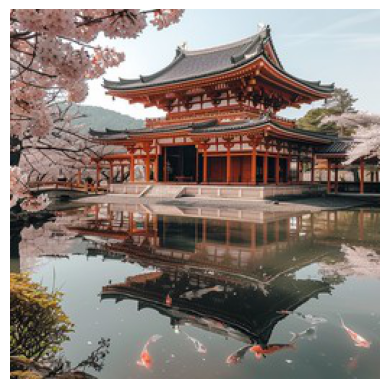

In [6]:
content_im = download_image(img1).to(def_device)
print('content_im.shape: ', content_im.shape)
show_image(content_im);

In [7]:
# check bounds
content_im.min(), content_im.max()

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

## **Optimizing Images**

We will begin by optimizing the raw pixels of an image, which is a pretty straight forward task when compared to optimizing weights in a neural network.

Here, we won't be working with large numbers of training samples and will use 1 sample for the baseline line and 1 sample for the style transfer portion.

In [8]:
# The model won't be working with tons of images. With 1 baseline and 1 style sample, we need to initialize 
# the dataloader in a way that it allows the model to update gradients in a stepwise manner by literally 
# transferring the style of one image to another.
class LengthDataset():
    def __init__(self, length=1): self.length = length

    def __len__(self): return self.length
    
    def __getitem__(self, idx): 
        # Return 0,0 to pass a dummy item to the Learner
        # We don't care about the dataset itself.
        return 0, 0

def get_dummy_dls(length=100):
    # Allows the dataloader to pass fake dataset of 100 items to the model to carry out a number of steps.
    return DataLoaders(DataLoader(LengthDataset(length), batch_size=1), # Training set
                       DataLoader(LengthDataset(1), batch_size=1))      # Validation with length 1

The `TensorModel` just passes a tensor / image to `nn.Parameter` in this instance since we aren't actually optimizing a model. We are optimizing an image, or more precisely, the _pixels of an image_ directly.

In [9]:
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())

    def forward(self, x=0): 
        # Passing x so that our Learner works as intended.
        return self.t

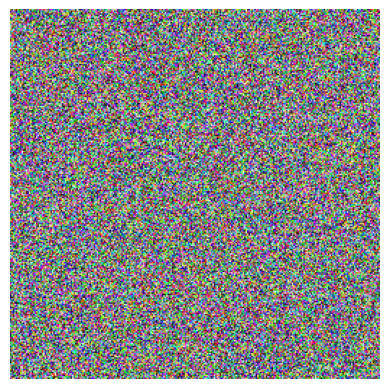

In [10]:
model = TensorModel(torch.rand_like(content_im))
show_image(model());

In [11]:
# To verify
print(model.t.requires_grad);  [p.shape for p in model.parameters()]

True


[torch.Size([3, 256, 256])]

We can also use `TrainCB` to setup the image optimizer. This would be preferred if we needed to pass in a larger number of parameters to the model.

In [12]:
class ImageOptCB(TrainCB):
    def predict(self, learn): learn.preds = learn.model() # Return image being optimized

    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds) # Evaluate by simply taking an image.

In [13]:
def loss_fn_mse(im):
    # Return loss of the content image and the target.
    return F.mse_loss(im, content_im)

In [14]:
model = TensorModel(torch.rand_like(content_im))
cbs = [ImageOptCB(), ProgressCB(), MetricsCB(), DeviceCB()]
learn = Learner(model, get_dummy_dls(100), loss_fn_mse, lr=1e-2,
               cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(2)

loss,epoch,train
0.031,0,train
0.001,0,eval
0.000,1,train
0.000,1,eval


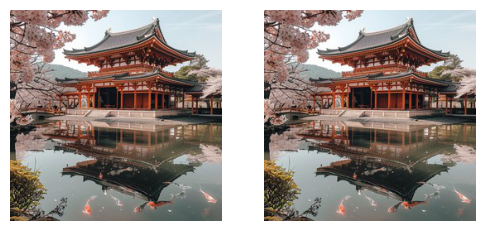

In [15]:
# Result (left) vs target image(right)
show_images([learn.model().clip(0, 1), content_im]);

### **View Progress**

This callback will allow us to see the training progress for the target moving from noise to a replica of the original sample. The images are logged every few iterations in `after_fit`.

In [16]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, log_every=10): store_attr(); self.images = [] ; self.i = 0

    def after_batch(self, learn):
        if self.i % self.log_every == 0: self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1

    def after_fit(self, learn): show_images(self.images)

loss,epoch,train
0.021,0,train
0.000,0,eval


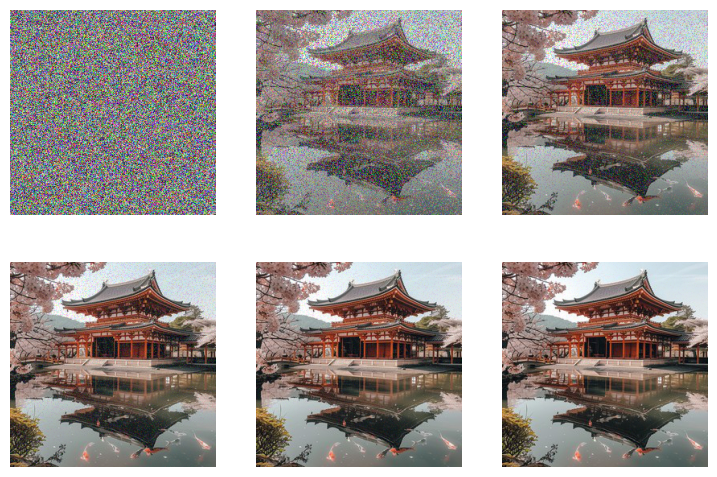

In [17]:
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_fn_mse, lr=1e-2,
                cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

## **Using VGG16 for Feature Extraction**

We'll use VGGNet for feature extraction. In particular, we will be extracting features from different layers of the network.

The VGG architecture stands for Visual Geometry Group, which consists of either 16 or 19 convolutional layers. Used primarily for classification tasks, VGG16 has an image input size of **224x244**. For full details on the model, read the paper titled ["Very Deep Convolutional Networks for Large-Scale Image Recognition"](https://arxiv.org/abs/1409.1556v6).


The interesting here is that the model flattens the final `7x7x512` layer into a linear layer `1x1x4096` and then to `1x1x1000`. This ends up being quite memory intensive. Also, to get a sense of how different layers maximize their activations to learn different features from their inputs, this [classic article on feature visualization](https://distill.pub/2017/feature-visualization/) is a must read.

![title](imgs/vgg-neural-network-architecture.png)

In [18]:
# VGG has numerous versions in the timm library
print(timm.list_models('*vgg*'))

['repvgg_a0', 'repvgg_a1', 'repvgg_a2', 'repvgg_b0', 'repvgg_b1', 'repvgg_b1g4', 'repvgg_b2', 'repvgg_b2g4', 'repvgg_b3', 'repvgg_b3g4', 'repvgg_d2se', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn']


In [19]:
vgg16 = timm.create_model('vgg16', pretrained=True).to(def_device).features

model.safetensors:   0%|          | 0.00/553M [00:00<?, ?B/s]

In [20]:
# This is the network architecture.
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

### **Normalize Images**

The VGG model was trained on normalized images and we need to ensure that our image stats match those that were used for the training process. For this we will require the stats of the ImageNet dataset. Also, since we are working with 3 channel images, broadcasting rules and input shapes need to be considered as well.

In [21]:
imagenet_mean = tensor([0.485, 0.456, 0.406]) # RGB means 
imagenet_std = tensor([0.229, 0.224, 0.225]) # RGB std devs

In [23]:
# Here we have the tensor shape  for the means
imagenet_mean.shape

torch.Size([3])

In [24]:
# But our content image has the shape 
content_im.shape

torch.Size([3, 256, 256])

In [25]:
# To ensure alignment with broadcasting rules we will add unit dimensions to the means
imagenet_mean[:, None, None].shape

torch.Size([3, 1, 1])

In [33]:
# Function to carry out normalization with reshaping
def normalize(img):
    imagenet_mean = tensor([0.485, 0.456, 0.406])[:, None, None].to(img.device)  
    imagenet_std  = tensor([0.229, 0.224, 0.225])[:, None, None].to(img.device)
    return (img - imagenet_mean) / imagenet_std # Normalize

In [27]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='cuda:0'), tensor(2.6400, device='cuda:0'))

In [31]:
normalize(content_im).mean(dim=(1, 2))

tensor([0.1460, 0.0548, 0.1610], device='cuda:0')

In [ ]:
# Torchvision transforms
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [32]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='cuda:0'), tensor(2.6400, device='cuda:0'))

### **Get Intermediate Representations - First Pass**

The hierarchy for CNN layers capturing different feature sets goes from gradients and textures in the early layers to complex feature types in later layers. We can extract feature representations from different layers to suit our own needs, which is incredibly flexible.

This approach i.e. the first pass, can be used to go through each layer manually to extract features.

In [34]:
def calc_features(imgs, target_layers=(18, 25)): # avoid mutable lists in default params to avoid bugs.
    x = normalize(imgs)
    feats = []
    for i, layer in enumerate(vgg16[:max(target_layers)+1]):
        x = layer(x)
        if i in target_layers:
            feats.append(x.clone())
    return feats

In [35]:
# Test the function to see shapes of the resulting feature maps.
feats = calc_features(content_im)
[f.shape for f in feats]

/home/bchaudhry/miniforge3/envs/miniai/lib/python3.11/site-packages/torch/nn/modules/conv.py:459: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995622/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


[torch.Size([512, 32, 32]), torch.Size([512, 16, 16])]

## **Optimizing an Image with Content / Perceptual Loss**

John Whitaker's got a great post on this subject titled ["An Explanantion of Style Transfer With a Showdown of Different Techniques"](https://wandb.ai/johnowhitaker/style_loss_showdown/reports/An-Explanation-of-Style-Transfer-with-a-Showdown-of-Different-Techniques--VmlldzozMDIzNjg0). In it, he introduces the inspiration behind content / perceptual loss.

> The first component of style transfer is having some way to capture the structure (a.k.a content) of an image that is somewhat independent of style...[or] a way to measure the similarity between two images that captures what objects are _where, without_ relying on simple features like color. 

We can attempt to optimize an image by comparing it's features from two later layers wuth those from the target image. We should be able to see the structure of the target emerge from the noise without seeing an accurate re-production if the target like we did in the previous MSE loss example.

In [41]:
class ContentLosstoTarget():
    def __init__(self, target_im, target_layers=(18, 25)):
        fc.store_attr()
        with torch.no_grad():
            # Calculate the features in the target layers
            self.target_features = calc_features(target_im, target_layers)

    def __call__(self, input_im):
        # Calling the equivalent of forward() in PyTorch and MiniAi.
        # Calculate MSE b/w the input features and target layer features
        # Here, input is the noisy image.
        return sum((f1 - f2).pow(2).mean() for f1, f2 in
                   zip(calc_features(input_im, self.target_layers), self.target_features))

loss,epoch,train
7.536,0,train
2.108,0,eval


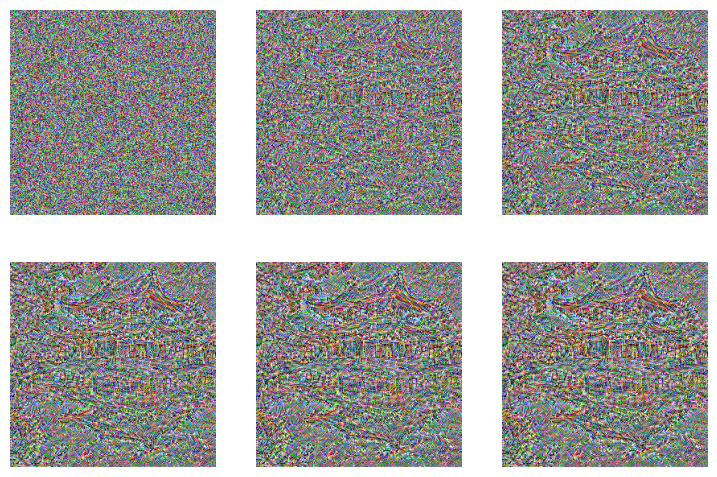

In [39]:
percep_loss_func = ContentLosstoTarget(content_im)
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), percep_loss_func, lr=1e-2,
                cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

We're starting to see some outlines of features which will be used in the Style Transfer section. However, it should be noted that the output from the TensorModel has boundaries that aren't clamped i.e. they can be less than 0 and greater than one.

Also, features being mapped by the VGGNet are highly dependent on its architecture, so different NNs will yeild different results.

loss,epoch,train
2.538,0,train
0.389,0,eval


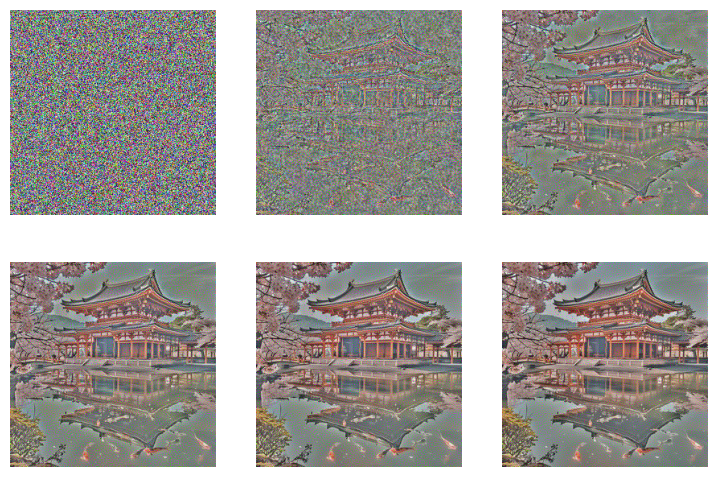

In [42]:
# Passing in earlier layers to see how feature importance is being determined by the model.
percep_loss_func = ContentLosstoTarget(content_im, target_layers=(1, 6))
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), percep_loss_func, lr=1e-2,
                cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

The takeaway at this stage is: extraction from earlier layers will result in an image which has a more rigid adherence to the source image, whereas deep layers capture features which are more associated with boundaries of key objects in both the background and foreground.

## **Style Loss with a Gram Matrix**

Continuing with Johno's article linked above:

> ...unfortunately, the feature maps from the early layers don't only show what features are present. They record where in the image those features are. Enter the gram matrix, a way to remove the spatial component and focus only on what kinds of features are present.
>
> This is a measure of what stylistic features are present and how correlated they are (i.e., which features tend to occur together) without any spatial component. So we can now compare the gram matrices of two images to measure how stylistically similar they are and use the difference (typically the mean squared error) as our loss function when optimizing our output image.
>
> If we combine both a style loss and a content loss, we will get an output that matches the overall layout of the content image while incorporating the same stylistic features as the style image. By varying which layers we focus on and scaling the different components of the loss function, we can get a number of different effects.
>
> Given a feature map with `f` features in an `h x w` grid, we'll flatten out the spatial component and then for every feature we'll take the dot product of that row with itself, giving an `f x f` matrix as the result. Each entry in this matrix quantifies how correlated the relevant pair of features are and how frequently they occur - exactly what we want. In this diagram each feature is represented as a colored dot.

![title](imgs/gram-matrix.png)

In [43]:
# Recreate the diagram ops
# 0 and 1 are used for simplicity, but we can work with other values as well to express correlations
t = tensor([[0, 1, 0, 1, 1, 0, 0, 1, 1],
            [0, 1, 0, 1, 0, 0, 0, 0, 1],
            [1, 0, 1, 1, 1, 1, 1, 1, 0],
            [1, 0, 1, 1, 0, 1, 1, 0, 0]])

In [46]:
# Using einsum to calculate the matmul operation
torch.einsum('fs, gs -> fg', t, t)

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

In [47]:
# Or we can use matmul()
t.matmul(t.T)

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

### **Implementation**

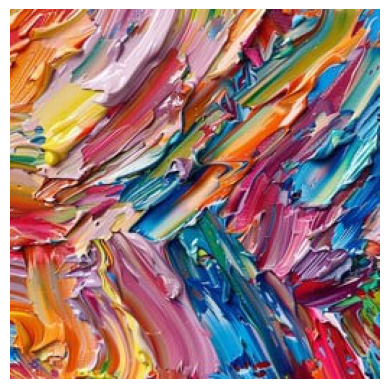

In [49]:
# Our style image
style_im = download_image(img2).to(def_device)
show_image(style_im);

In [52]:
def calc_grams(img, target_layers=(1, 6, 11, 18, 25)):
    # We will scale according to widthxheight to account for images of different sizes.
    # s = w*h will provide a relative measure instead of an absolute measure. 
    # 'bchw, bdhw -> bcd' applies if we're using batches.
    # The iterator returned is from fastcore.L()
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) 
            for x in calc_features(img, target_layers))

In [53]:
style_grams = calc_grams(style_im)

In [55]:
# Return gram matrices for features from different layers
# We are targetting 5 layers, each with its own set of features i.e. 64x64, 128x18 and so on
[g.shape for g in style_grams]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [57]:
# Since we are using fastcore's L, we can also call attrgot()
style_grams.attrgot('shape')

(#5) [torch.Size([64, 64]),torch.Size([128, 128]),torch.Size([256, 256]),torch.Size([512, 512]),torch.Size([512, 512])]

In [62]:
class StyleLossToTarget():
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        fc.store_attr()
        with torch.no_grad(): self.target_grams = calc_grams(target_im, target_layers)

    def __call__(self, input_im):
        # Calculate the mse b/w gram matrices. So there is no spatial component and comparisons
        # are only carried out between features and correlations between features.
        return sum((f1 - f2).pow(2).mean() for f1, f2 in
                   zip(calc_grams(input_im, self.target_layers), self.target_grams))

In [60]:
style_loss = StyleLossToTarget(style_im)

In [63]:
style_loss(content_im)

tensor(100.0128, device='cuda:0', grad_fn=<AddBackward0>)

## **Style Transfer**

loss,epoch,train
24.383,0,train
19.061,0,eval


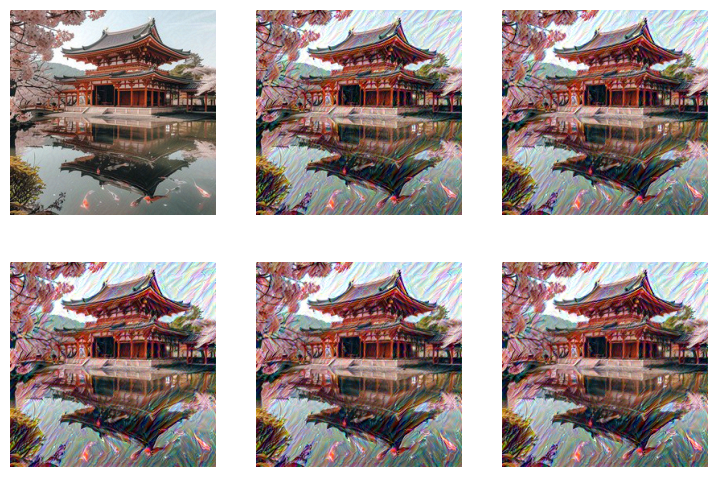

In [64]:
# Starting point is the content image instead of random noise
model = TensorModel(content_im) 
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLosstoTarget(content_im)

def combined_loss(x):
    return style_loss(x) + content_loss(x)

learn = Learner(model, get_dummy_dls(150), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

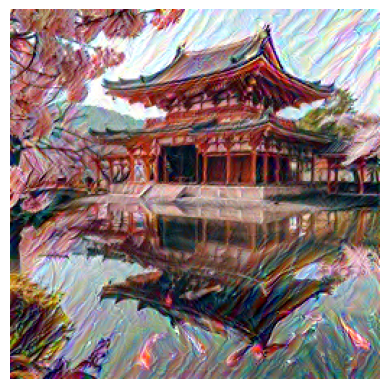

In [65]:
# Display the final result
show_image(learn.model().clip(0, 1));

We can experiment with adjustments to the style loss, picking a different set of layers to optimize from, random starting images etc.

loss,epoch,train
37.933,0,train
30.464,0,eval


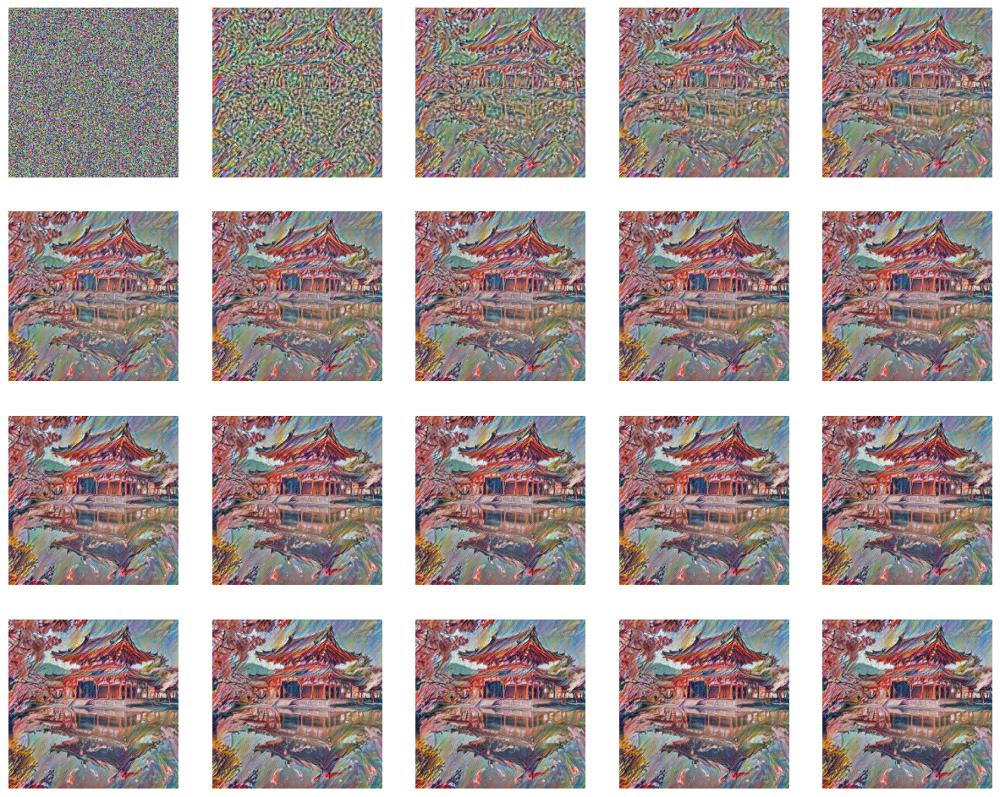

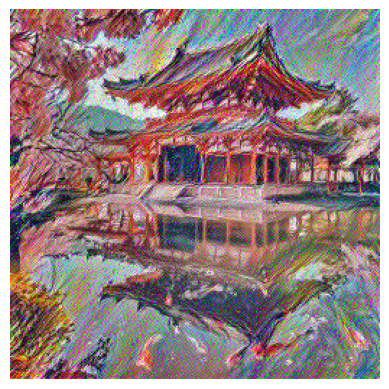

In [76]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLosstoTarget(content_im, target_layers=(9, 11, 12, 20, 29))

def combined_loss(x):
    # Scaling the loss
    return style_loss(x) + content_loss(x)*0.30

# Train for more steps with higher lr
learn = Learner(model, get_dummy_dls(1000), combined_loss, lr=5e-2 ,cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(50)])

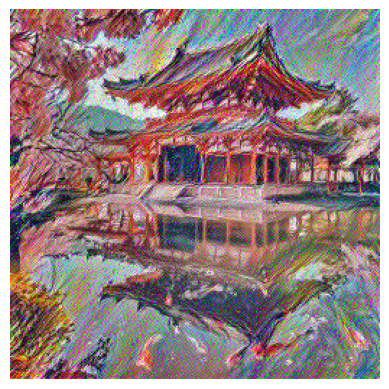

In [77]:
show_image(learn.model().clip(0, 1));

### **Comparisons - Non MiniAi**

This approach only works for one off purposes like tutorials. If we're not using the right amount of abstractions, things can get really messy really quickly! 

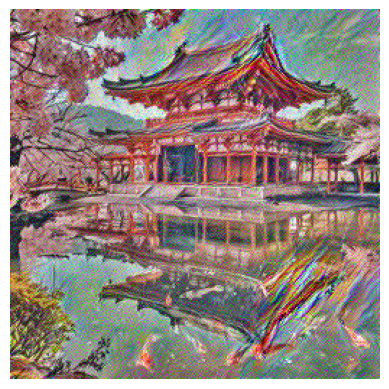

In [78]:
# Image to be optimized
im = torch.rand(3, 256, 256).to(def_device)
im.requires_grad = True

# Setup the optimizer
opt = torch.optim.Adam([im], lr=5e-2)

# Define the loss func
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLosstoTarget(content_im, target_layers=[6, 18, 25])

def combined_loss(x):
    return style_loss(x) * 0.2 + content_loss(x)

# Optimization loop
for i in range(300):
    loss = combined_loss(im)
    loss.backward()
    opt.step()
    opt.zero_grad()

# Results
show_image(im.clip(0, 1));